# Проект.
Проведение анализа рынка общественного питания города Москвы с целью открытия нового заведения.
Целью проекта является выбор типа заведения для открытия, а так же определение района открытия и ценового уровня заведения

## Изучение исходных данных

In [74]:
#Загружаем библиотеки
import pandas as pd
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

In [33]:
# Открываем таблицу и смотрим ее краткое содержание 

try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [34]:
# Вывожу данные о датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Дата-сет содержит информацию о 8406 объектах. Информация о катеогрийности (тип заведения и принадлежность к сети), цифрового рейтинга, а так же о местоположении (адрес, район, координаты) представлена в полном объеме для всех заведений.

Субьективные параметры представлены не для всех заведений, т.к. оценка по чашке кофе характерна для кофеен, а по среднему чеку - для заведений с более серьезной кухней. Опять же в меру субьективности оценок пользоватлей не все заведения имеют такого рода оценку.

Количество мест длжно быть выражено целыми числами, но наличие пропуска данных (NaN) переводит столбец с целыми числами в формат float. Это нормально.

## Предобработка данных
### Дубликаты

In [35]:
# Проверка явных дупликатов
data.duplicated().sum()

0

In [36]:
#Проверка неявных дубликатов

#Приведем все названия к нижнему регистру
#data['name'] = data['name'].str.lower()
#data.duplicated().sum()

#Проверка дала 0, поэтому для красоты дальгейшего вывода названий заведений данный раздел закомментрован

In [37]:
# Проверка неявных дупликатов
data.duplicated(['lat', 'lng', 'category']).sum()

18

In [38]:
twins = data.groupby(['lat', 'lng', 'category'])['name'].nunique().sort_values(ascending=False).head(17)
twins

lat        lng        category       
55.692059  37.557188  кафе               2
55.670021  37.552480  кафе               2
55.788610  37.783970  кафе               2
55.891936  37.536068  кафе               2
55.708354  37.652705  ресторан           2
55.762784  37.594602  ресторан           2
55.665142  37.478603  кафе               2
55.743041  37.566494  быстрое питание    2
55.837181  37.497324  ресторан           2
55.806307  37.497566  ресторан           2
55.759603  37.791702  ресторан           2
55.782729  37.513952  ресторан           2
55.658424  37.737291  кафе               2
55.752040  37.586158  ресторан           2
55.822498  37.823358  кафе               2
55.810949  37.799413  кафе               2
55.714942  37.574534  пиццерия           2
Name: name, dtype: int64

In [39]:
twins_total = pd.merge(data, twins,  how='inner', left_on=['lng', 'lat', 'category'], right_on = ['lng', 'lat', 'category'])
display (twins_total)

,name_x,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_y
0,Встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN,2
1,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN,2
2,Meat Лав,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN,2
3,Family Cafe Mayak,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN,2
4,Кафе-кулинария Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,0,10.0,2
5,Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0,2
6,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,2
7,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,2
8,Чайхана Doner кафе,кафе,"Москва, Измайловский проспект, 61, стр. 2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,15.0,2
9,Чайхана Döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN,2


**Дубликаты**
Явных дубликатов нет.
Неявных добликатов - 4 штуки:

    leon
    сикварули	
    чайхана doner кафе
    more poke

В таком дата-фрейме их наличие или отсутвие никак не повлияет на резульат.

При обработке данных обнаружилась сеть ресторанов Яндекс Лавка. Это даркстор, доставка продуктов и еды. К заведениям общепита не могу привязать. Считаю нужным удалить.

In [40]:
data = data.query('name != "Яндекс Лавка"')
len(data)

8337

### Пропуски. 
Более половины заведений не имеют оценки по уровню цены в меню. Оценки эти носят субъктивный характер, поэтому использовать их как 100%-истинные нельзя, поэтому пропуски в этих столбах не требуют удаления всей записи о заведении. Кроме того, как я указывал выше, информация в столбах о срежднем чеке и чаше каппучина релевантна для заведений разного класса, опэтому пропуски должны быть, но они не должны быть поводом для удаления.

### Предобработка данных
Создаем столбец с названиями улиц

In [41]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1])
#data['street'].value_counts()

In [42]:
#Создаем столбец с булевым значением True для круглосуточных заведений
data['is_24/7'] = data['hours'].str.contains('круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных
### Категории заведений

In [43]:
#Сгруппируем заведения по категориям и посчитаем количество
rest_type_chart = data.groupby('category').agg({'category' : 'count'})
rest_type_chart = rest_type_chart.rename(columns={'category': 'total_count'})
rest_type_chart = rest_type_chart.sort_values(by = 'total_count', ascending=False)
display (rest_type_chart)

,total_count
category,
кафе,2378
ресторан,1974
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


В датасете представлены заведения 8 типов. Более половины всех заведений в городе - это кафе и рестораны. Разнообразие в кухне, цене позволяет открывать больше число заведений на разный вкус и кошелек.

Кофейни - третий по популярности вид заведений. Кофейни - это заведения, где можно отдохнуть во время прогулки или встретиться, разбавив разговор чашечкой кофе с десертом. Если оперировать большими группами людей, то для большинства кофе и напитки на его основе более менее одинаковые во всех кофейнях, поэтому в таких заведениях надо найти баланс между дизайном, расположением (это напрямую влияет на стоимость "одинакового" продукта) и ценой. 

Бары, пиццерии и фастфуды - довольно близкое количество таких заведений в городе. Как мне видится причина в их узком специалитете по ассортименту или аудитории. Кофейню тоже можно причислить к такому роду заведений, но потенциальных поситителей в кофейне в разы больше, чем у баров или пиццерий.

Столовые. Бюджетные места для еды. Аренда в Москве везде велика, поэтому открыть недорогую столовую - задача непростая. Конечно же ассортимент и качество будет невысокого уровня.

Булочные - по личным ощущениям - это заново родившийся формат заведений. Они легко открываются в каждом новом ЖК,предлагают свежий хлеб, а так же являются кофейней в миниатюре без претензий к дорогому дизайну и зачастую без официантов, но со столиками.

In [44]:
fig = px.bar(rest_type_chart, x=rest_type_chart.index, y='total_count', title='Распределение по видам заведений', text="total_count")
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Категория заведений') # подпись для оси X
fig.update_yaxes(title_text='Кол-во заведений') # подпись для оси Y
fig.show() 

### Есть свободные места?

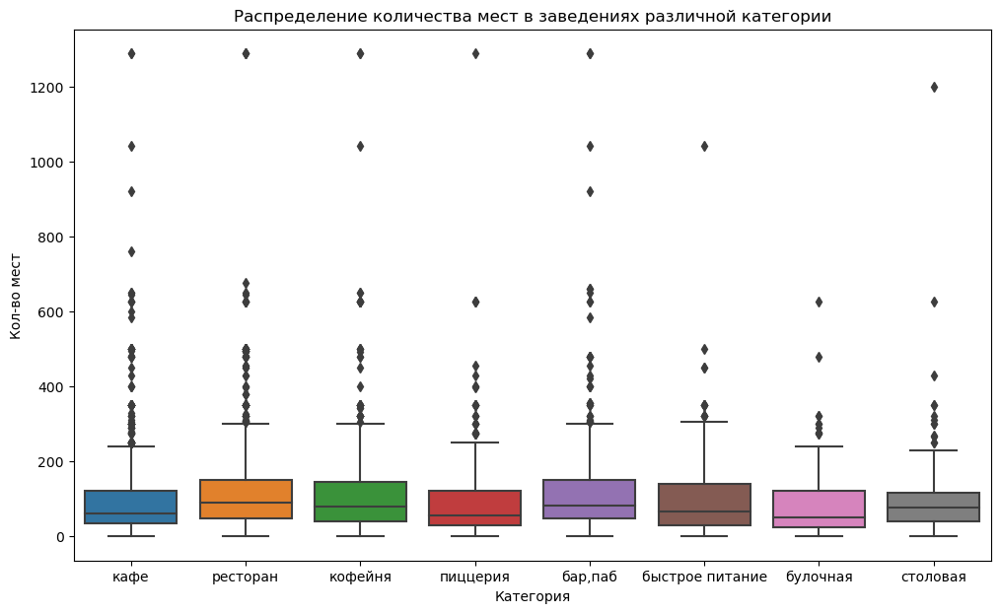

In [45]:
plt.figure(figsize=(12, 7)) 
ax = sns.boxplot(x='category', y='seats', data=data) 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества мест в заведениях различной категории')
plt.xlabel('Категория')
plt.ylabel('Кол-во мест')
# отображаем график на экране
plt.show()

In [46]:
# Создадим порядок категорий по росту медианы
sorted_index = data.groupby('category').agg({'seats' : 'median'}).sort_values(by = 'seats')

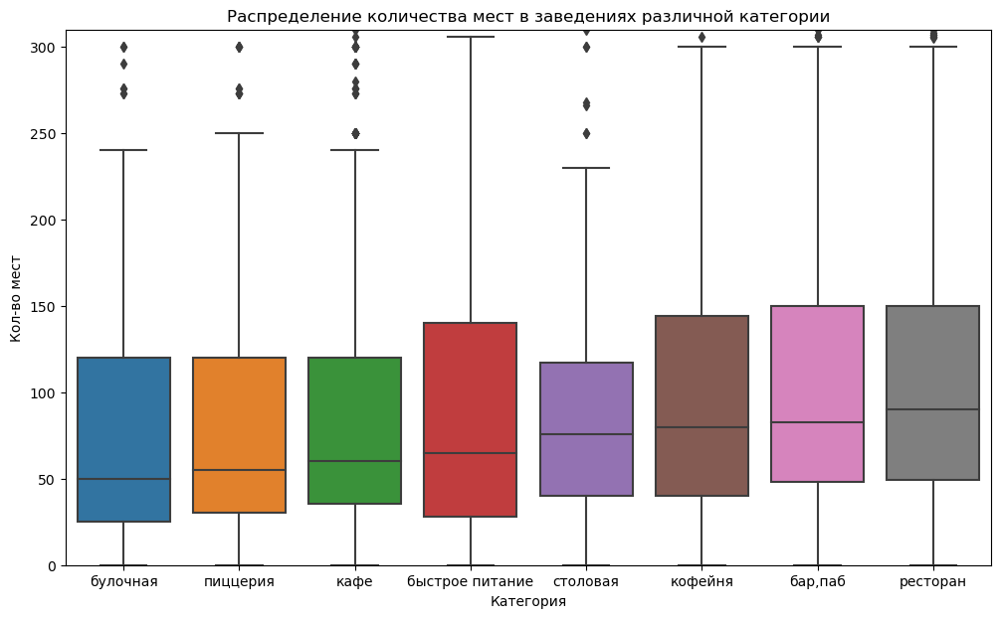

In [47]:
#Выведем ящики с усами в порядке роста медианы, а так же обрежем график по длине усов
plt.figure(figsize=(12, 7)) 
ax = sns.boxplot(x='category', y='seats', data=data, order = sorted_index.index) 
plt.ylim(0, 310)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества мест в заведениях различной категории')
plt.xlabel('Категория')
plt.ylabel('Кол-во мест')
# отображаем график на экране
plt.show()

In [48]:
data['seats']. describe ()

count    4760.000000
mean      108.343908
std       121.843699
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

**Вывод** Исследование количества мест показало большое количество аномалий в этих данных. Вероятно, это опечатки с лишним нулем для количества больше 100. В какой-то степени это подтверждают распределения по кофейням и булочным с первым квартилем в районе 25-30 мест - В говроде много небольших заведений. В тоже время мне тяжело представить булочную на 200-250 мест.
Тут явно что-то не так. 

### Сети

In [49]:
#Рассчитаем распределение заведений по принадлежности к сетям
net = data.groupby('chain')['chain'].count()
net

chain
0    5201
1    3136
Name: chain, dtype: int64

In [50]:

fig = go.Figure(data=[go.Pie(labels=net.index, values=net)])

fig.update_layout(
    title="Распределение заведений между сетевыми и несетевыми"
    )
fig.show()



**Вывод**
Сетевые заведения составляют 37.6% всех заведений в Москве. Посмотрим распределение по Категориям

In [51]:
rest_type_chart_net = data.groupby('category').agg({'category' : 'count', 'chain' : 'mean'})
rest_type_chart_net = rest_type_chart_net.sort_values(by = 'chain', ascending=True)
rest_type_chart_net['chain'] = round(rest_type_chart_net['chain'] * 100,1)
rest_type_chart_net

,category,chain
category,,
"бар,паб",765,22.1
столовая,315,27.9
кафе,2378,32.8
ресторан,1974,33.5
быстрое питание,603,38.5
кофейня,1413,51.0
пиццерия,633,52.1
булочная,256,61.3


In [52]:
fig = px.bar(rest_type_chart_net, x='chain', y=rest_type_chart_net.index, title='Доля сетевых заведений по категориям', text="chain")
fig.update_xaxes(title_text='Доля сетевых заведений') # подпись для оси X
fig.update_yaxes(title_text='Категория заведений') # подпись для оси Y
fig.show() 

**Вывод**
62% булочных - сетевые. Это подтверждает мое предположение, что булочные только начинают свое распространение чеерз сети (или франшизы).

Половина кафе и пиццерий - так же ожидаемый результат. В каждом районе знакомые заведения. Для тех, кто хочет особую пиццу или необычный (не приевшийся) интеррьер - есть вторая половина заведений со своим неповторимым рецептом и столиками.

Самыми уникальными заведениями являюсят бары. Оплот индивидуальности 

### Самые популярные сети
Найдем ТОП-15

In [53]:
data_chain = data.query('chain == 1')
top15 = data_chain.groupby('name').agg({'name' : 'count'})
top15 = top15.rename(columns={'name': 'qty'})
top15 = top15.sort_values(by = 'qty', ascending=False).head(15)
top15

,qty
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42
Кулинарная лавка братьев Караваевых,39


Для горизонтальных баров нужно изменить параметры расположения текста в функции ax.text. Вместо x + width/2 нужно использовать width для задания координаты x, а вместо y + height/2 нужно использовать y для задания координаты y.

ax = sns.barplot(x='qty', y=top15.index, data=top15)
for g in ax.patches:
    ax.annotate(format(g.get_height(), '.1f'),
                   (g.get_width() / 1., g.get_y(),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')

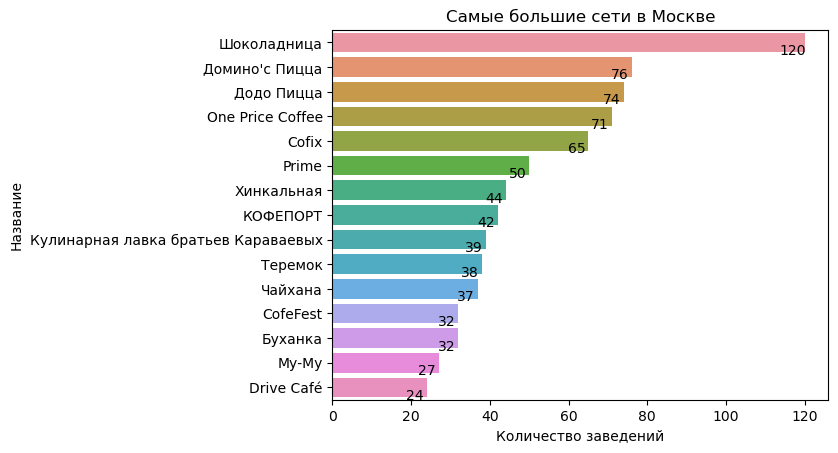

In [54]:
ax = sns.barplot(x='qty', y=top15.index, data=top15) 
for g in ax.patches:
    ax.annotate(format(g.get_width(), '.0f'),
                   (g.get_width() - 3 , g.get_y()),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')
plt.title('Самые большие сети в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название')
plt.show();



В ТОП-15  мы видим 5 кофеен, кафе, булочные, пиццерии, рестораны. Нет только баров. Исключения в жизни возможны, но бары в большинстве своем заведения уникальные.
Не сильно обращаю внимание на кофейни, поэтому Кофепорт и Cofefest для меня не знакомые имена, все остальное знакомо.
PS Что тут делает Я-Лавка? 

### Административные округи Москвы

В датасете представлены заведения из всех округов Москвы, кроме Новой Москвы

Рассмотрим распределение категрий заведений по каждому району

In [55]:
district_count = data.groupby('district').size().reset_index(name='count').sort_values(by='count', ascending = True)
display (district_count)
districts = data.groupby(['district', 'category']).size().reset_index(name='count')
districts = districts.sort_values(['count','district'], ascending=[False, True])
districts = pd.merge(districts, district_count, left_on = 'district', right_on = 'district', how = 'left')
districts['ratio'] = round(districts['count_x'] / districts['count_y']*100,1)
districts = districts.rename(columns={'count_x': 'Кол-во', 'count_y': 'Всего в округе'})
districts.head(5)

,district,count
4,Северо-Западный административный округ,407
7,Юго-Западный административный округ,698
6,Юго-Восточный административный округ,706
0,Восточный административный округ,786
1,Западный административный округ,842
8,Южный административный округ,880
3,Северо-Восточный административный округ,884
2,Северный административный округ,896
5,Центральный административный округ,2238


,district,category,Кол-во,Всего в округе,ratio
0,Центральный административный округ,ресторан,666,2238,29.8
1,Центральный административный округ,кафе,464,2238,20.7
2,Центральный административный округ,кофейня,428,2238,19.1
3,Центральный административный округ,"бар,паб",364,2238,16.3
4,Юго-Восточный административный округ,кафе,282,706,39.9


In [56]:
fig = px.bar(district_count, x='count', y='district', title='Распределение заведений по округам Москвы', text="count")
fig.update_xaxes(title_text='Количество заведений') # подпись для оси X
fig.update_yaxes(title_text='Округ Москвы') # подпись для оси Y
fig.show() 

In [57]:
# Строим график
fig = px.bar(districts, x='district', y='ratio', hover_data=['Кол-во', 'Всего в округе'], color='category')
fig.update_layout(title='Визуализация категорий по районам', xaxis_title='Административные районы Москвы', yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=45)
fig.show()

### Рейтинг по категориям

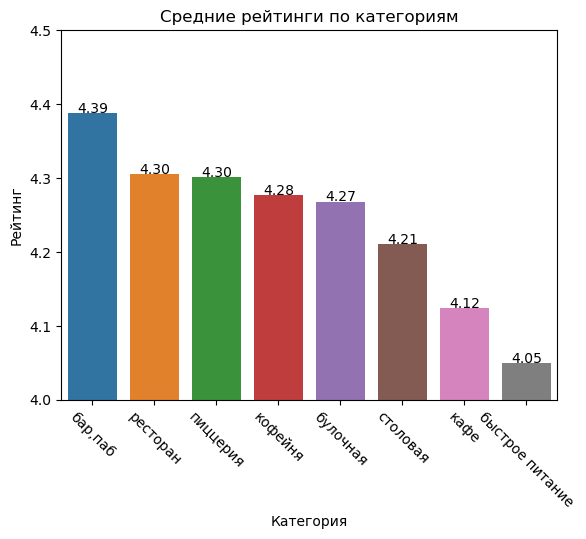

In [58]:
rating = data.groupby('category').agg({'rating' : 'mean'}).sort_values('rating', ascending=False)
ax = sns.barplot(x=rating.index, y='rating', data=rating) 
for g in ax.patches:
    ax.annotate(format(g.get_height(), '.2f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()+0.03),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')
plt.xticks(rotation=-45)
plt.title('Средние рейтинги по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
ax.set(ylim=(4, 4.5));

Бар в Москве - это место, где можно весело потраить много денег, поэтому надо постараться, чтобы люди туда заходили. Владельцы баров явно стараются.
Места для "просто покушать" - столовые, кафе и фастфуды так же отчаяно борятся за массового клиента, но скорее соотношением цена-качество, поэтому восхищенных оценок гораздо меньше, чем у баров, но, возможно, клиентов больше.
Пиццерии, кофейни, булочные будучи в большинство своем сетевыми заведениями стараются быть близкими по уровню сервиса к ресторанам, поэтому их оценки близки.

### Рейтинги по районам

In [59]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by = 'rating', ascending = False)
display (rating_df)

,district,rating
5,Центральный административный округ,4.378150
2,Северный административный округ,4.240067
4,Северо-Западный административный округ,4.209337
8,Южный административный округ,4.187614
1,Западный административный округ,4.185511
0,Восточный административный округ,4.179389
7,Юго-Западный административный округ,4.177937
3,Северо-Восточный административный округ,4.150679
6,Юго-Восточный административный округ,4.106232


### Хороплет
Строю фоновую картограмму со средним рейтингом заведений каждого округа

In [78]:
from folium import Marker, Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap (1).geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
).add_to(m)


# выводим карту
m

### Маркеры и кластеры
Нанесе маркеры всех заведений на карту и объединю в кластеры

In [61]:
from folium.plugins import MarkerCluster
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### ТОП-15 улиц

In [63]:
# Выведем ТОП-15 по числу заведений

top_streets = data['street'].value_counts().head(15)
top_streets

 проспект Мира             184
 Профсоюзная улица         121
 проспект Вернадского      106
 Ленинский проспект        106
 Ленинградский проспект     95
 Дмитровское шоссе          87
 Каширское шоссе            77
 Варшавское шоссе           74
 Ленинградское шоссе        70
 МКАД                       65
 Люблинская улица           60
 улица Вавилова             55
 Кутузовский проспект       54
 улица Миклухо-Маклая       48
 Пятницкая улица            48
Name: street, dtype: int64

In [64]:
df_top_streets = pd.merge(data, top_streets, left_on='street', right_on=top_streets.index, how = 'inner')
df_top_streets.head(5)

,street,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_x,is_24/7,street_y
0,Дмитровское шоссе,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False,87
1,Дмитровское шоссе,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False,87
2,Дмитровское шоссе,Кушай Город,столовая,"Москва, Дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,Дмитровское шоссе,False,87
3,Дмитровское шоссе,Суши & пицца,ресторан,"Москва, Дмитровское шоссе, 169, корп. 6",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.928943,37.540548,4.0,NaN,NaN,NaN,NaN,0,NaN,Дмитровское шоссе,False,87
4,Дмитровское шоссе,Мир пиццы,кафе,"Москва, Дмитровское шоссе, 151, корп. 5",Северный административный округ,"ежедневно, 09:00–02:00",55.896323,37.540918,4.2,NaN,NaN,NaN,NaN,0,46.0,Дмитровское шоссе,False,87


In [65]:
df_top_streets = df_top_streets.rename(columns={'street_y': 'street_total'})
df_top_streets.head()

,street,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_x,is_24/7,street_total
0,Дмитровское шоссе,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False,87
1,Дмитровское шоссе,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False,87
2,Дмитровское шоссе,Кушай Город,столовая,"Москва, Дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,Дмитровское шоссе,False,87
3,Дмитровское шоссе,Суши & пицца,ресторан,"Москва, Дмитровское шоссе, 169, корп. 6",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.928943,37.540548,4.0,NaN,NaN,NaN,NaN,0,NaN,Дмитровское шоссе,False,87
4,Дмитровское шоссе,Мир пиццы,кафе,"Москва, Дмитровское шоссе, 151, корп. 5",Северный административный округ,"ежедневно, 09:00–02:00",55.896323,37.540918,4.2,NaN,NaN,NaN,NaN,0,46.0,Дмитровское шоссе,False,87


In [66]:
#df_ts = df_top_streets.groupby('street').size().reset_index(name='count')
#df_ts
df_tss = df_top_streets.groupby(['street', 'category', 'street_total']).size().reset_index(name='count')
df_tss = df_tss.sort_values('street_total', ascending=False)
df_tss
# Строим график
fig = px.bar(df_tss, x='street', y='count', hover_data=['street_total'],color='category')
fig.update_layout(title='Распределение заведений на ТОП-15 улиц', xaxis_title='Улицы Москвы', yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=45)
fig.show()

Самая примечательная улица по распределению - это МКАД. Торговые центры и заправки представлены в осоновном кафе - почти 70%. На остальных улицах ничего особо удивительного не заметно.

### Одна улица - одно меню.
Рассматрим улицы с одним заведением.


In [67]:
# Соберем улицы с одним заведением в одну таблицу
one_street = data.groupby('street')['name'].count().reset_index()
one_street = one_street[one_street['name'] == 1]


#Сделаем срез датасета по таким улицам
#df_one_street = pd.merge(data, one_street, left_on='street', right_on='street', how = 'inner')
df_one_street = data[data['street'].isin(one_street['street'])]

In [68]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_one_street.apply(create_clusters, axis=1)

# выводим карту
m

In [69]:
#Проанализируем информацию по таким улицам
rest_type_chart2 = df_one_street.groupby('category').agg({'category' : 'count'})
rest_type_chart2 = rest_type_chart2.rename(columns={'category': 'total_count'})
rest_type_chart2 = rest_type_chart2.sort_values(by = 'total_count', ascending=False)
rest_type_chart2

,total_count
category,
кафе,161
ресторан,88
кофейня,85
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,18
булочная,8


In [70]:
fig = px.bar(rest_type_chart2, x=rest_type_chart2.index, y='total_count', title='Распределение по видам заведений', text="total_count")
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Категория заведений') # подпись для оси X
fig.update_yaxes(title_text='Кол-во заведений') # подпись для оси Y
fig.show() 

Вероятнось того, что на улице появится второе заведение напрямую зависит от длины улицы.  Поэтому улицы с одним заведением - это зачастую переулки, проезды и небольшие улочки. Тихие места прекрасны для отдыха поситителей, поэтому такие улочки стали популярны для открытия кафе, ресторанов и кофеен.

Для заведений, рассчитаных на быстрый перекус - булочные, пиццерии и фаст-фуды - нужна проходимость больших улиц.


### Цены в центре и ближе к МКАДу
Исследуем медиану среднего чака в заведениях различных округов Москвы

In [71]:
av_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
display (av_bill)

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [79]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap (1).geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
ma = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=av_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(ma)


# выводим карту
ma

**Вывод** Данные о среднем чеке представлены только для 37,5% заведений дата-сета, поэтому делать какие-либо выводы по этим цифрам не стоит.

Центр конечно же будет дорогим. Кутузовское и рублевское направление деешвым не назовешь, но в целом ЗАО все же жилой округ, в отличие от культурно - делового ЦАО. 

Округи как лучи расходятся от центрального округа, доходя до МКАДа, поэтому для решения вопроса о цене и удаленности необходимо ввести параметр удаленности от нулевого километра и строить распределения по расстоянию от центра (как это было в проекте о недфижимости в Ленинградской области. В данном случае можно говорить о направлениях. Округи с высокой долей промышленности в прошлом - СВАО, ЮВАО  и ЮАО да и восточная часть города в целом деешвле противоположных западных округов.

### Общий вывод

Проаналиизровав базу данных по заведениям общепита города Москвы были определены:
- Общее количество заведений 8337
- Самый распространенный тип заведения - кафе
- Доля сетвых заведений - 37.6%
- Самая популярная улицапо количеству заведений - Проспект Мира
- Самые рейтинговые заведения - бары и пабы
- Самые высокие рейтинги заведений - в ЦАО
- В ЦАО заведений в 3 раза больше, чем в среднем по другим округам.
- Самый дорогой округ - ЦАО и ЗАО, но данных на мой взгляд не хватает.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Средний чек центрального округа самый высокий, что не удивительно. Не сильно по цене уступает и Западный округ. Бюджетные заведения легче встретить ЮАО, ЮВАО и СВАО.
</div>

## Открытие новой кофейни
Получится ли зайти на этот рынок?


Презентация  <https://disk.yandex.ru/i/WfFW8KQqZ0knVw>


In [80]:
#Сделам срез по кофейням
coffee_df = data.query('category == "кофейня"')
#Определим их количество
len(coffee_df)

1413

In [81]:
print('Средняя цена чашки кофе в москве -', round(coffee_df['middle_coffee_cup'].mean()), 'рублей')

Средняя цена чашки кофе в москве - 175 рублей


In [83]:
#Посмотрим, где они есть
cof_dis = coffee_df.groupby('district')['name'].count().reset_index().sort_values(by = 'name', ascending = False)
cof_dis['ratio'] = round(cof_dis['name']/sum(cof_dis['name'])*100,1)
cof_dis

,district,name,ratio
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,150,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,105,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


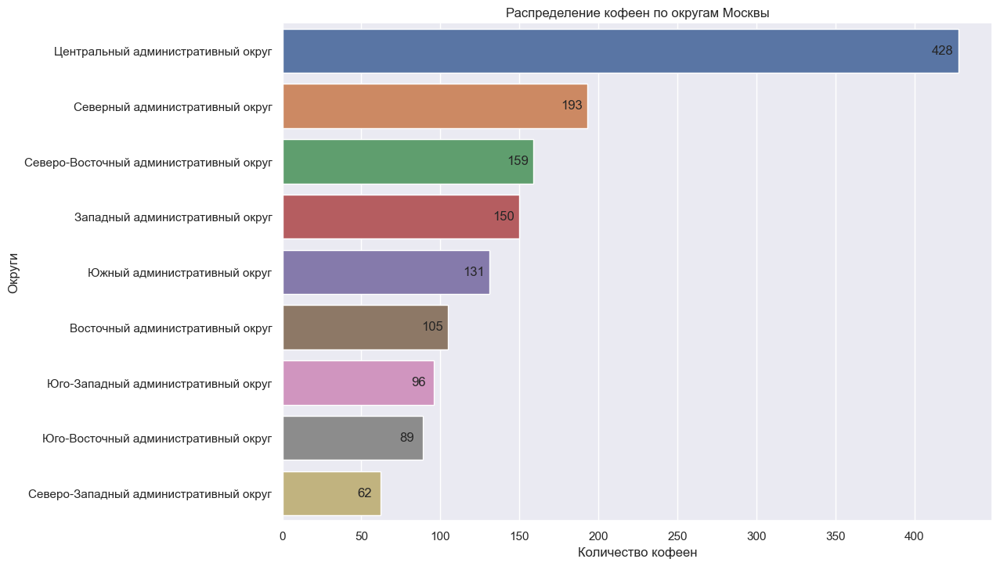

In [84]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.barplot(x=cof_dis['name'], y=cof_dis['district'], data=cof_dis) 
#plt.xticks(rotation=-45)
for g in ax.patches:
    ax.annotate(format(g.get_width(), '.0f'),
                   (g.get_width() - 10 , g.get_y()),
                   ha = 'center', va = 'center',
                   xytext = (0, -20),
                   textcoords = 'offset points')
plt.title('Распределение кофеен по округам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('Округи');

В городе 1413 кофеен, 1/3 располагается в ЦАО

### Кофе круглоуточно

In [85]:
# Проверим, насоклько характерна круглосуточная работа для кофеен
cof_247 = coffee_df.groupby('is_24/7')['name'].count().reset_index()
cof_247
fig = go.Figure(data=[go.Pie(labels=cof_247['is_24/7'], values=cof_247['name'])])
fig.show() 

В городе всего 76 круглосуточных кофеен, что составляет 5,44% от общего числа. Это нехарактерный режим работы для заведений такого класса.

### Рейтинги, районы и цены на кофе

In [86]:
# Соберем таблицу с рейтингами по районам, средней ценой чашки кофе и экспериментальным индикатором, учитывающим одновременно рейтинги и цену.
cof_rank = coffee_df.groupby('district').agg({'rating' : 'mean', 'middle_coffee_cup' : 'median'}).reset_index()
cof_rank['cumul']=cof_rank['rating']*cof_rank['middle_coffee_cup']
cof_rank.sort_values(by = 'cumul', ascending=False)

,district,rating,middle_coffee_cup,cumul
7,Юго-Западный административный округ,4.283333,198.0,848.100000
5,Центральный административный округ,4.336449,190.0,823.925234
1,Западный административный округ,4.195333,189.0,792.918000
4,Северо-Западный административный округ,4.325806,165.0,713.758065
3,Северо-Восточный административный округ,4.216981,162.5,685.259434
2,Северный административный округ,4.291710,159.0,682.381865
8,Южный административный округ,4.232824,150.0,634.923664
6,Юго-Восточный административный округ,4.225843,147.5,623.311798
0,Восточный административный округ,4.282857,135.0,578.185714


In [87]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
maa = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cof_rank,
    columns=['district', 'cumul'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Особый индикатор',
).add_to(maa)


# выводим карту
maa

FileNotFoundError: [Errno 2] No such file or directory: '/datasets/admin_level_geomap.geojson'

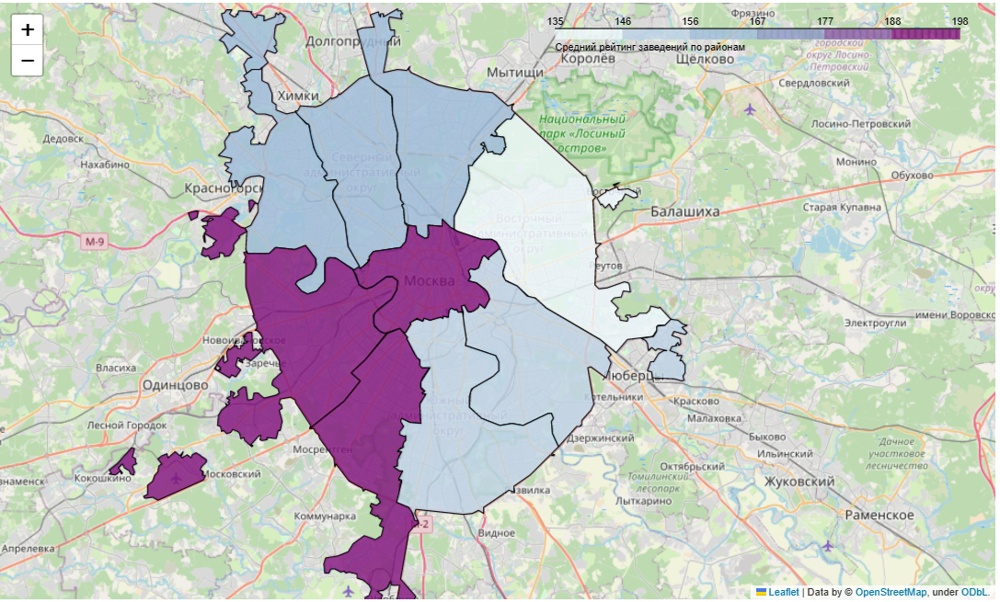 - цена кофе по районам
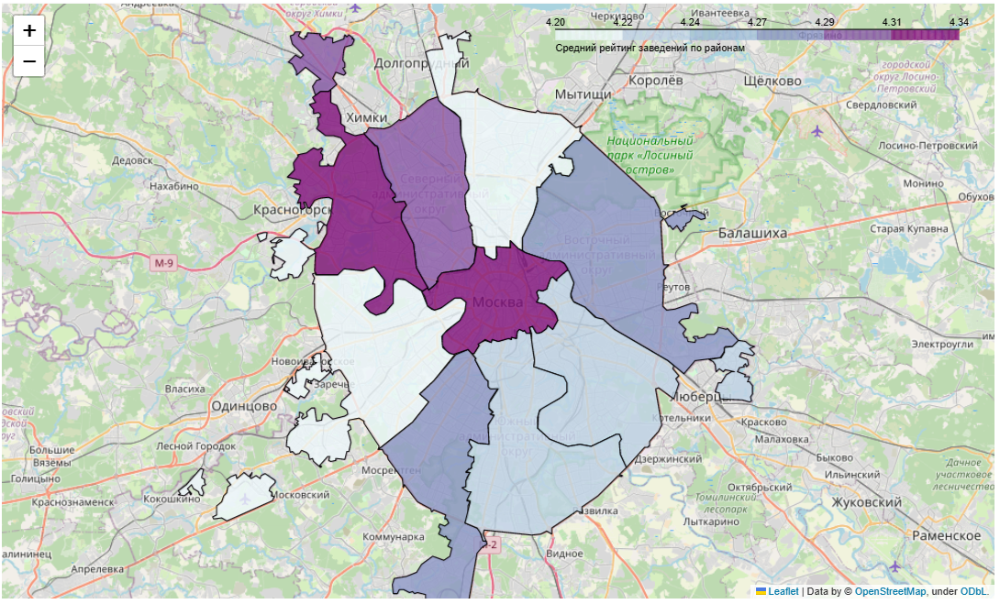 - Рейтинг заведений по районам
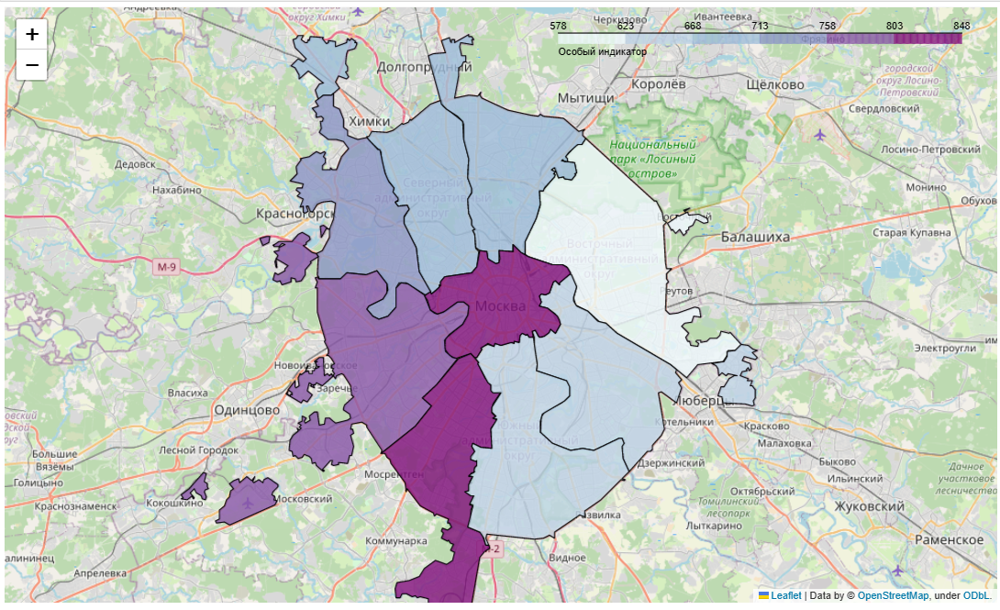 - особый индикатор

При открытии кофейни мечты мы полагаем, что это будет классное место, куда люди юудут приходить постоянно, значит нужны локации, близкие к крупным учебным заведениям и местам притяжения.
- Центральный округ исключается. Он пересыщен подобным заведениями, а поток поситителей не отличается стабильностью состава, т.к. в центр приезжают погулять, культурно отдохнуть, поэтому гости зайдут либо в сетевую кофейню, либо в ближайшую.
- Юго-Западный и Западные районы прекрасно подходят, т.к. там мы можем найти МГУ, Губкинский унверситет, Пироговский Мед, МГИМО, РУДН.

Конкуренция. При расчете на высокий рейтинг заведения надо понимать, что в среднем по округе.
- Западный и Юго-Западный округ не дотягивают до популярных кофеен центра, опэтому в этих районах есть прекрасная возможность показать себя.

Цена на кофе.
- Треугольник центрального, западного и юго-западного районов отличается максимальной ценой на чашку кофе. Вероятно, одной из причин является геограифческая престижность этих районов Москвы и соответсвующая ее стоимость аренды помещений.
- Если цена вокруг более-менее одинаковая, а заведение у нас будет уютнее остальных, то цены на кофе можно сделать на уровне конкурентов, платить за аренду все равно придется. Но для постоянных гостей вполне можно завести программу лояльности и сделать их прибывание еще более приятным.

Итого: Локация около м. Университет или м. Беляево. Цены - на уровне конкурентов + система лояльности.